In [4]:
%load_ext autoreload
%autoreload 2

import sys
sys.path.append('../')
sys.path.append('../hovernet')
sys.path.append('../deconvplugin')

import json
import os
import pickle
import torch
import scanpy as sc

PATH = '/home/luca/Documents/data/'

#'/cluster/CBIO/data1/lgortana/'
#'/home/luca/Documents/data/'

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


# Load data

In [5]:
# names
adata_name = 'CytAssist_11mm_FFPE_Human_Ovarian_Carcinoma'
sim_tag = "6_moco_clusters_700spots_balanced_15mean_15var"
model_tag = "alpha_0_lr_0.0001_weights_False_divergence_kl_sim_balanced_resnet18_128"

In [6]:
import pandas as pd

data_path = os.path.join(PATH, adata_name)
sim_path = os.path.join(data_path, "sim")

#load image_dict
image_dict = torch.load(os.path.join(sim_path, f'{sim_tag}_image_dict_64.pt'))

#load ground truth
ground_truth = pd.read_csv(os.path.join(sim_path, f'{sim_tag}_gt.csv'), index_col=0)
ground_truth.index = ground_truth.index.astype(str)

In [9]:
#load model infos
model_dir = os.path.join('../models', model_tag)

with open(os.path.join(model_dir, 'info.pickle'), 'rb') as f:
    model_info = pickle.load(f)

In [26]:
from deconvplugin.analysis.pred_analyzer import PredAnalyzer

analyzer = PredAnalyzer(model_info=model_info,
                        model_state="final",
                        adjusted=False,
                        ground_truth=ground_truth, 
                        image_dict=image_dict
                        )

Loading predicted labels...
Loading true labels...
Use `add_attributes(seg_dict=your_seg_dict)` to add one.


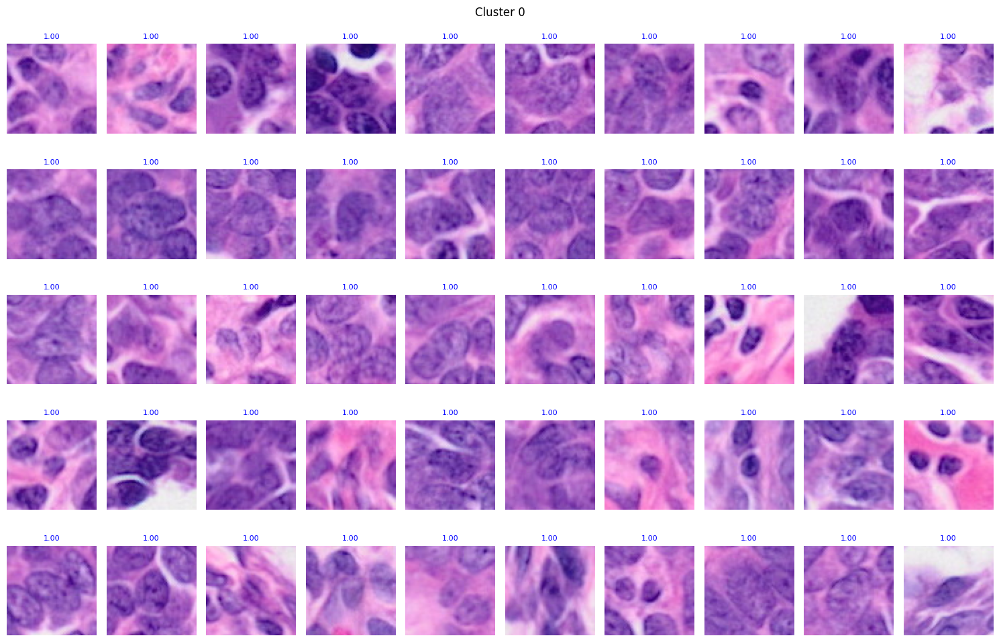

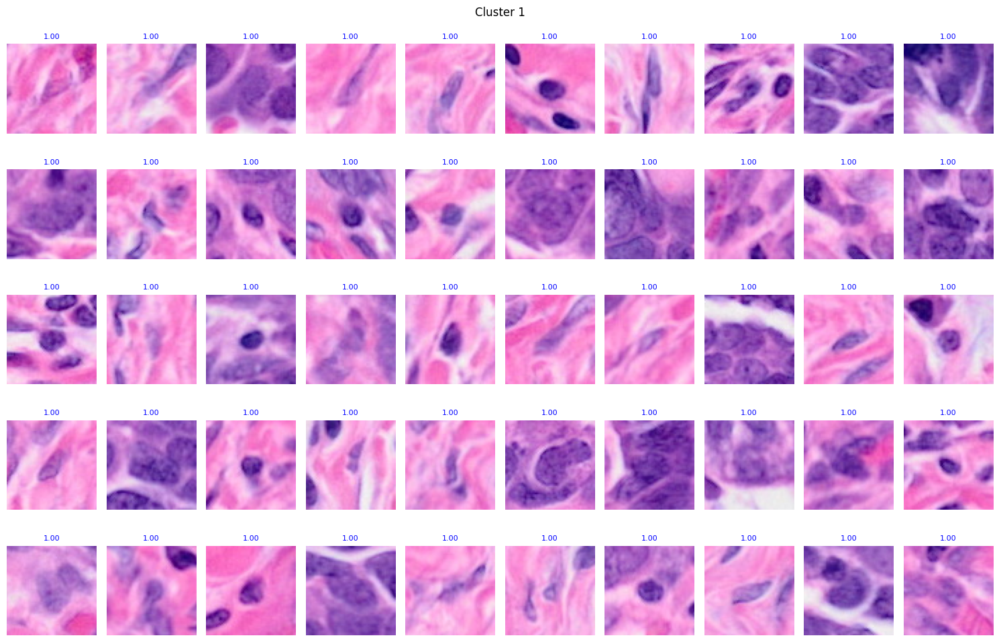

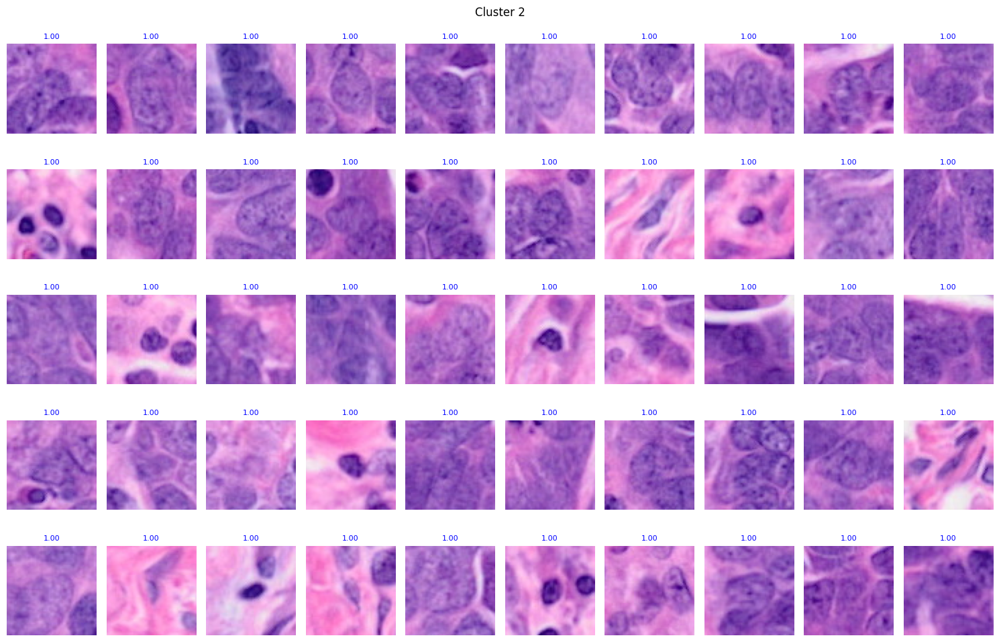

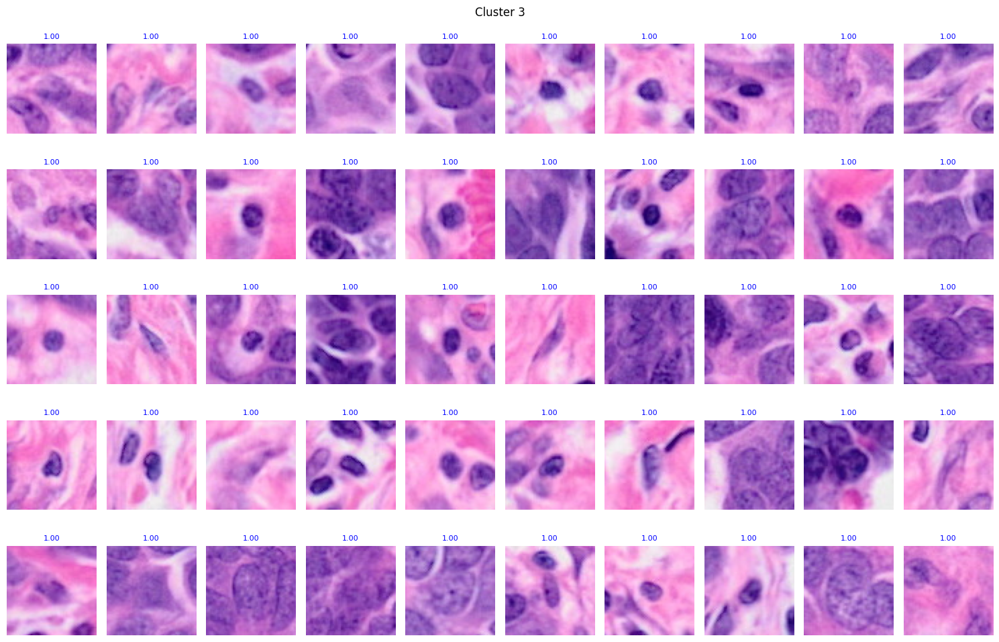

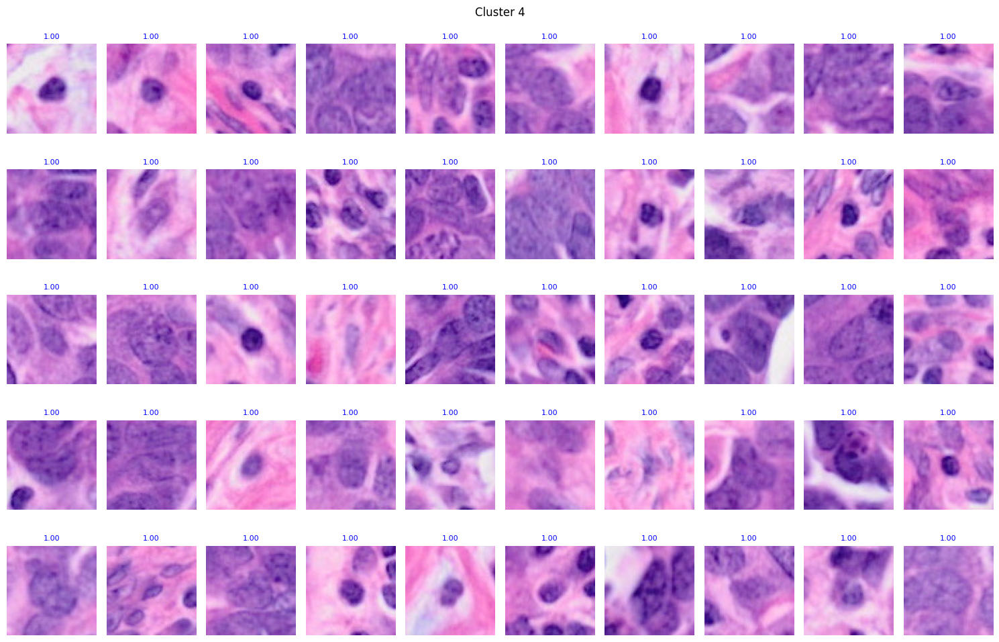

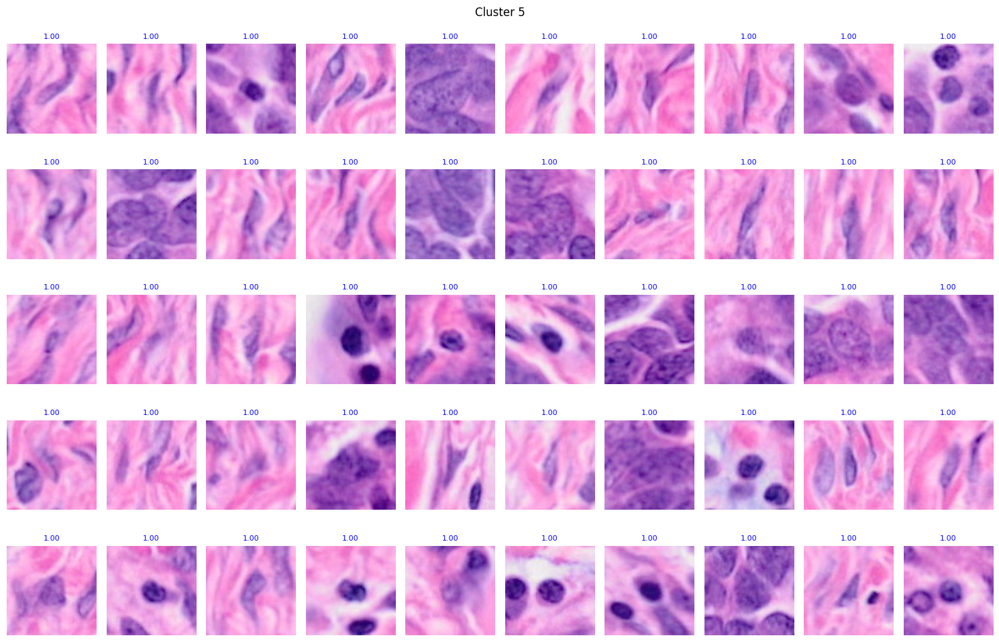

In [27]:
for ct in analyzer.ct_list:
    analyzer.plot_grid_celltype(cell_type=ct, n=50, selection="max", display=True)

Randomly selected spot_id: 5


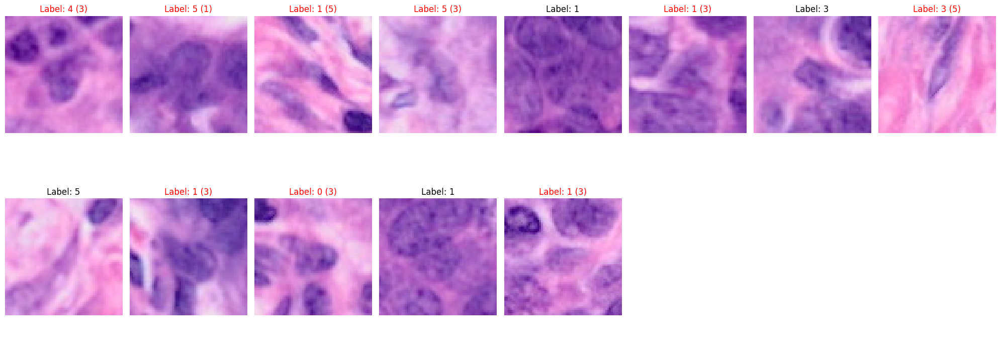

In [28]:
analyzer.plot_mosaic_cells()

In [29]:
analyzer.evaluate_spot_predictions()

{'Spearman Correlation': 0.10503667925367084,
 'Pearson Correlation': 0.11729245470211659,
 'Weighted MSE': 0.0025982941042314097,
 'MSE': 0.015595713931826106,
 'Weighted MAE': 0.01618810064362668,
 'MAE': 0.09713857009037818,
 'R^2 Score': -0.4318537891721319,
 'Balanced Accuracy': 0.21773386831333852,
 'Weighted F1 Score': 0.16575063420332722,
 'Weighted Precision': 0.19830658757814762,
 'Weighted Recall': 0.18857142857142858}

In [30]:
perf = analyzer.evaluate_cell_predictions()
perf

{'Global Accuracy': 0.20571032021413702,
 'Balanced Accuracy': 0.2057806112058482,
 'Weighted F1 Score': 0.2024625908326928,
 'F1 Score (Per Class)': {'Cluster 0': 0.08727010457987738,
  'Cluster 1': 0.16312464101091326,
  'Cluster 2': 0.2901830282861897,
  'Cluster 3': 0.18836728668438146,
  'Cluster 4': 0.16763925729442972,
  'Cluster 5': 0.31887143997870643},
 'Weighted Precision': 0.20361415157065263,
 'Precision (Per Class)': {'Cluster 0': 0.10960144927536232,
  'Cluster 1': 0.15786548082267926,
  'Cluster 2': 0.32708177044261066,
  'Cluster 3': 0.18831168831168832,
  'Cluster 4': 0.15243608297153882,
  'Cluster 5': 0.28742802303262954},
 'Weighted Recall': 0.20571032021413702,
 'Recall (Per Class)': {'Cluster 0': 0.07249850209706411,
  'Cluster 1': 0.1687462863933452,
  'Cluster 2': 0.2607655502392344,
  'Cluster 3': 0.18842291789722387,
  'Cluster 4': 0.18621096051856217,
  'Cluster 5': 0.3580394500896593},
 'Confusion Matrix': array([[121, 294, 120, 427, 343, 364],
        [217

In [18]:
pd.DataFrame(perf["Confusion Matrix"], index=analyzer.ct_list, columns=analyzer.ct_list)

,Cluster 0,Cluster 1,Cluster 2,Cluster 3,Cluster 4,Cluster 5
Cluster 0,90,308,114,567,265,325
Cluster 1,194,285,399,249,294,262
Cluster 2,148,207,506,291,319,201
Cluster 3,225,288,172,404,325,279
Cluster 4,210,319,205,377,249,337
Cluster 5,46,400,159,336,191,541
